In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import cv2
import requests

The dataset contains of 1.225.029 images and 14945 classes. The dataset consists of 3 columns: the id, the image link and the landmark_id (class number). There are 181 class that have only 1 image and 13002 classes that have less than 100 images. We will choose the classes that have between 1000-2000 images in each in order for the model to have enough data to train. 

In [2]:
train = pd.read_csv('train.csv')

In [4]:
train.shape

(1225029, 3)

In [5]:
train.head()

,id,url,landmark_id
0,97c0a12e07ae8dd5,http://lh4.ggpht.com/-f8xYA5l4apw/RSziSQVaABI/...,6347
1,650c989dd3493748,https://lh5.googleusercontent.com/-PUnMrX7oOyA...,12519
2,05e63ca9b2cde1f4,http://mw2.google.com/mw-panoramio/photos/medi...,264
3,08672eddcb2b7c93,http://lh3.ggpht.com/-9fgSxDYwhHA/SMvGEoltKTI/...,13287
4,fc49cb32ef7f1e89,http://lh6.ggpht.com/-UGAXxvPbr98/S-jGZbyMIPI/...,4018


In [3]:
train.sort_values("landmark_id")

,id,url,landmark_id
214355,9c72c5aa9dc30c61,http://lh3.ggpht.com/-qDuF6QmmLh0/SgnLqstPCVI/...,0
302639,87d758ec476d67d0,http://mw2.google.com/mw-panoramio/photos/medi...,0
840377,e8f5d139190cf632,https://lh5.googleusercontent.com/-cLcLfGk8K8k...,0
961874,886b4d64cbaeec7a,http://mw2.google.com/mw-panoramio/photos/medi...,0
1001883,a92f2f29bab56bbc,http://mw2.google.com/mw-panoramio/photos/medi...,0
...,...,...,...
1076707,aa97f379f0bf9f70,None,None
164840,46c482068db66cf0,None,None
757562,5e7f0058e798b521,None,None
1076805,91b4dc5e31687507,None,None


In [3]:
train["landmark_id"].value_counts()

None     70438
9633     48561
6051     47835
6599     21785
9779     17604
         ...  
12265        1
11974        1
13762        1
4047         1
10331        1
Name: landmark_id, Length: 14945, dtype: int64

In [9]:
len(train.landmark_id.unique()) #total number of labels 

14945

In [10]:
train = train.replace("None", np.nan)

In [11]:
train.isna().sum() #check nans

id                 0
url            70438
landmark_id    70438
dtype: int64

In [15]:
train = train.dropna()

In [12]:
train =train.sort_values("landmark_id").reset_index(drop=True)
train

,id,url,landmark_id
0,e7beefaa66e4c762,http://lh5.ggpht.com/-UWVuI3r54YQ/SCSNIHOoyiI/...,0
1,3104ba012ebd6524,http://lh5.ggpht.com/-s85XaLYLL4k/SY6G0zNvqFI/...,0
2,89735d6bd3ed3a82,https://lh6.googleusercontent.com/-W7Z0zPkBKWw...,0
3,92616a7dab885214,https://lh6.googleusercontent.com/-A2SKtYj89pQ...,0
4,90187c0b6f3fa112,https://lh4.googleusercontent.com/-ciIvVoX0BZs...,0
...,...,...,...
1225024,1065abc7dd8aa0df,NaN,NaN
1225025,38d5ed62053c043c,NaN,NaN
1225026,6cadadb49ef96d5a,NaN,NaN
1225027,32805b3f6a98deee,NaN,NaN


In [16]:
len(train.landmark_id.unique()) #removed 1 label

14944

# check different class images

Some images have people in them, some links are invalid

In [4]:
from PIL import Image
import requests
from io import BytesIO

UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x000001B418B57E50>

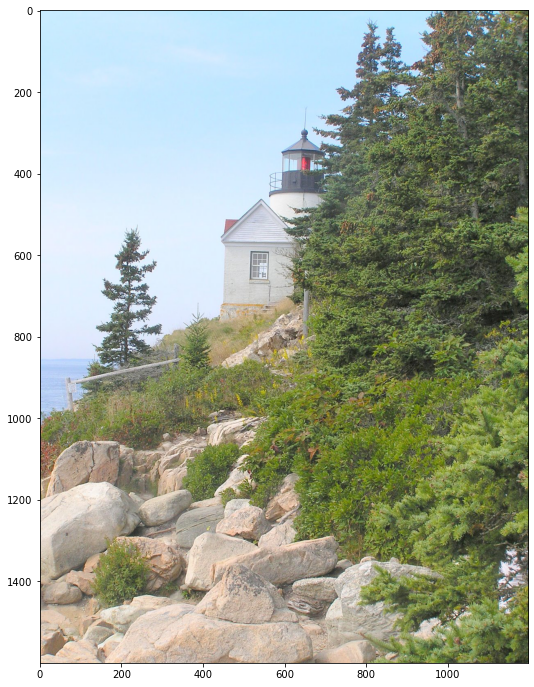

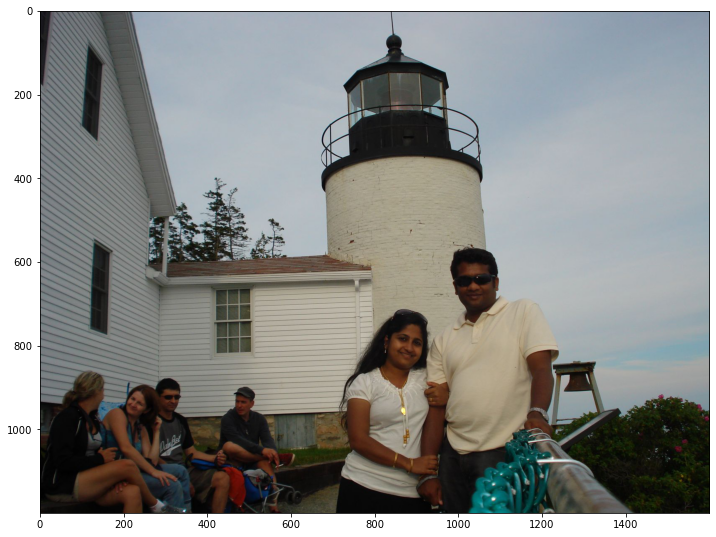

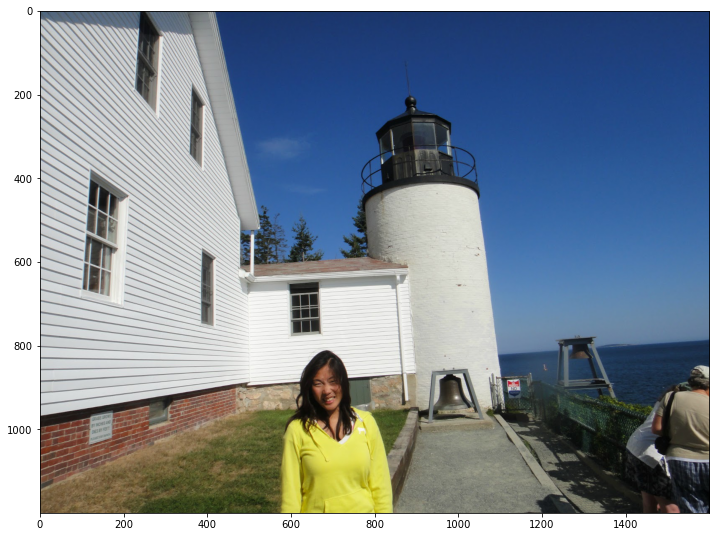

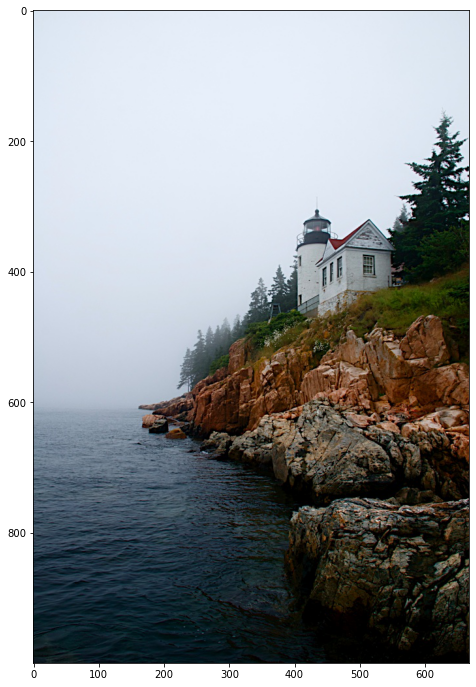

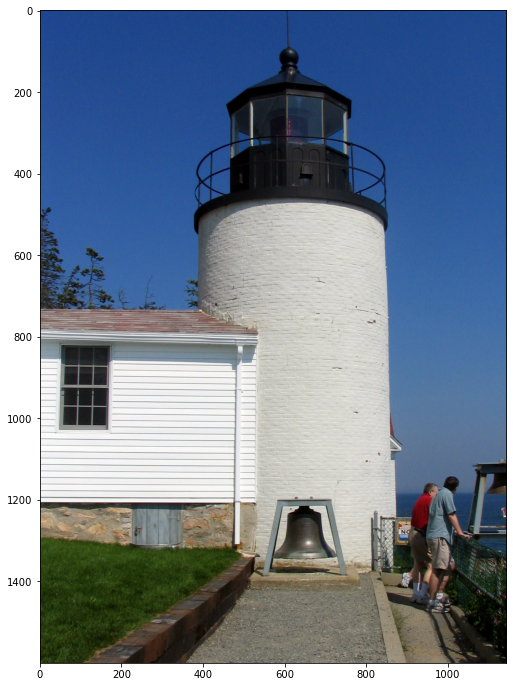

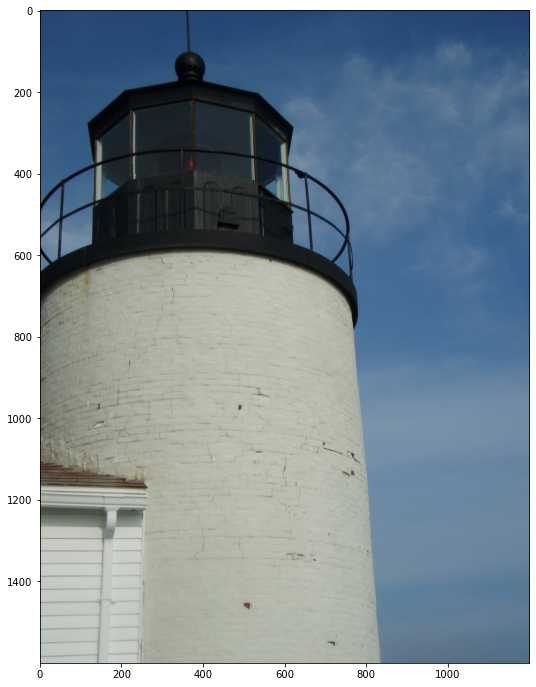

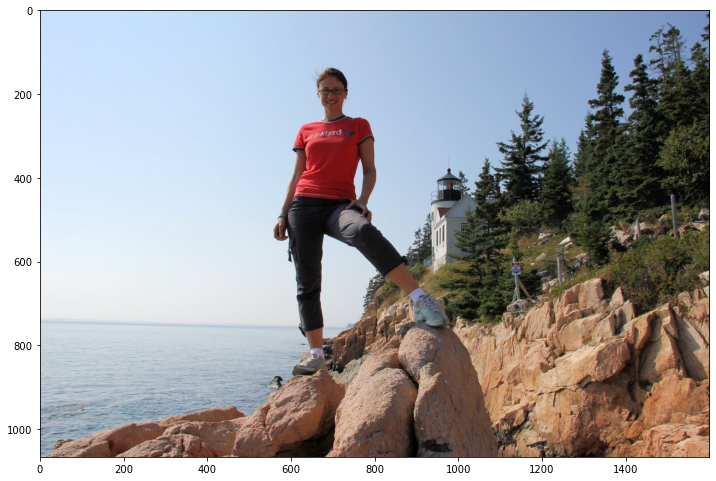

In [5]:
classid = '9999'
d = train[train['landmark_id']==classid].reset_index(drop=True).head(10)
for i in range(len(d)):
    response = requests.get(d['url'][i])
    img = Image.open(BytesIO(response.content))
    plt.figure(figsize= (12,12))
    plt.imshow(img)

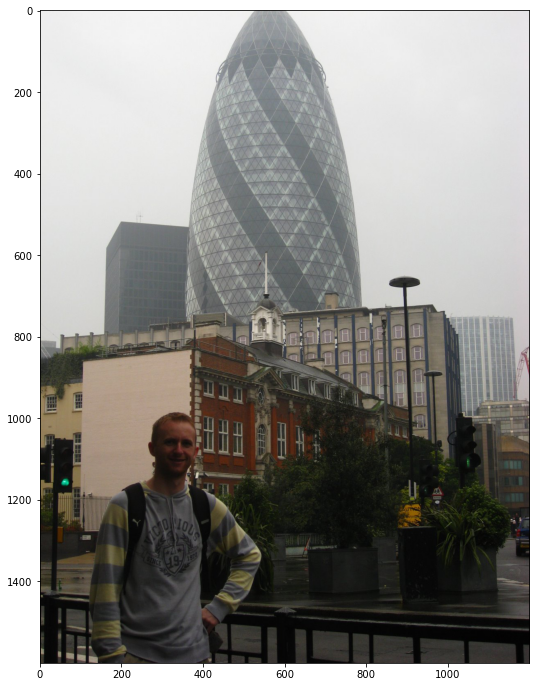

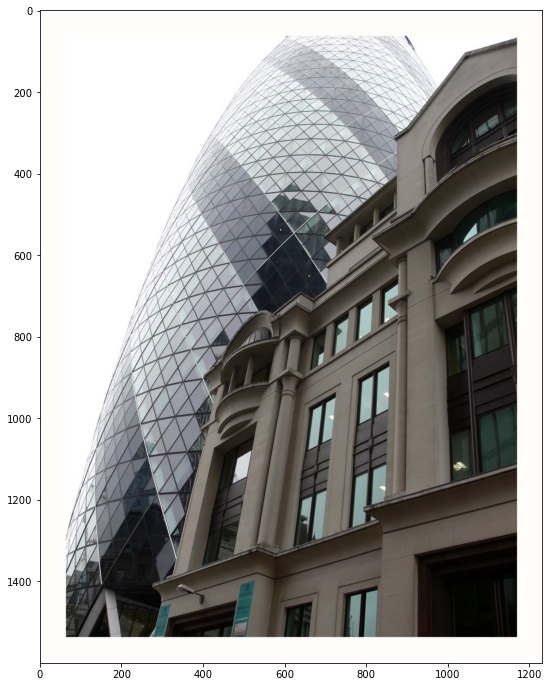

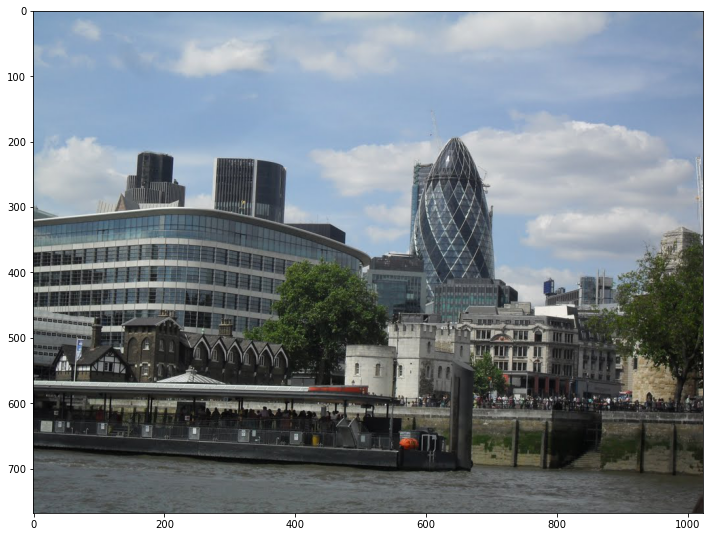

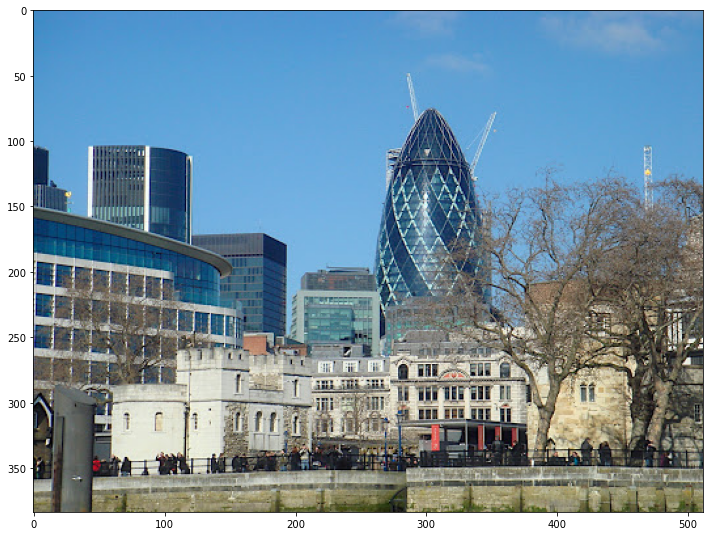

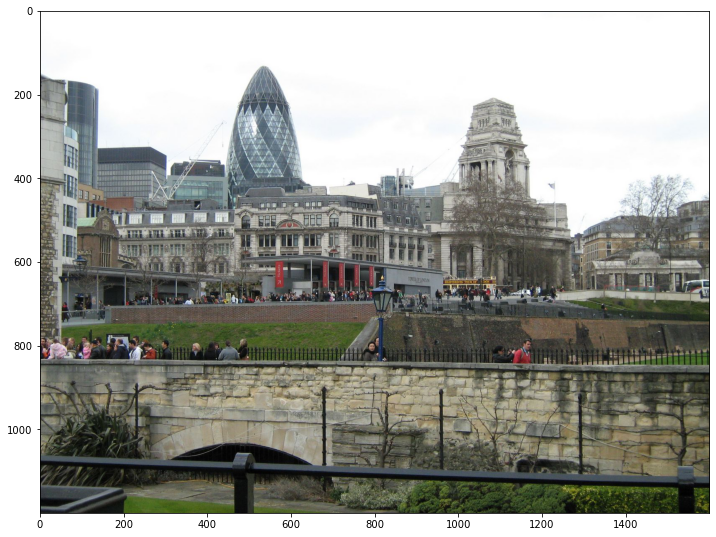

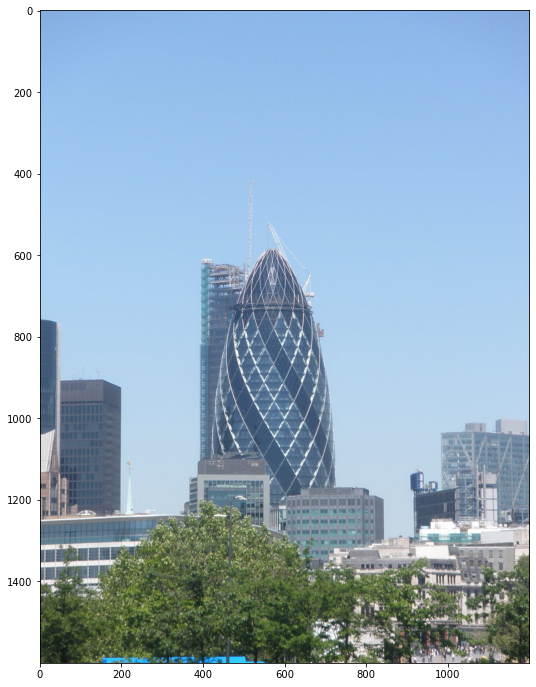

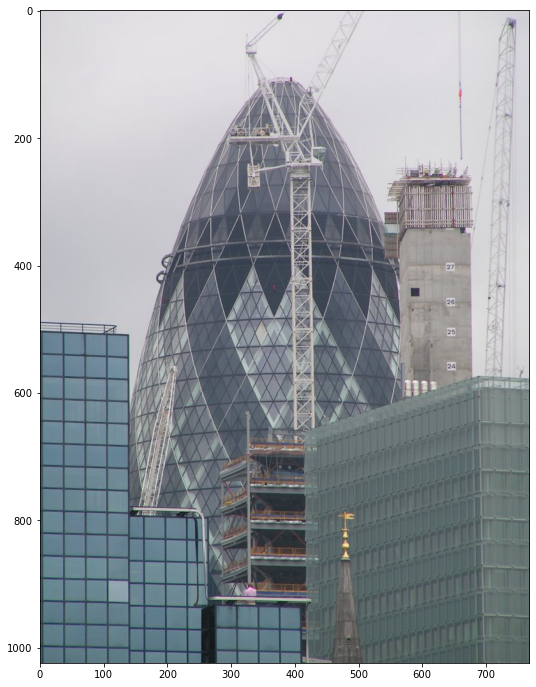

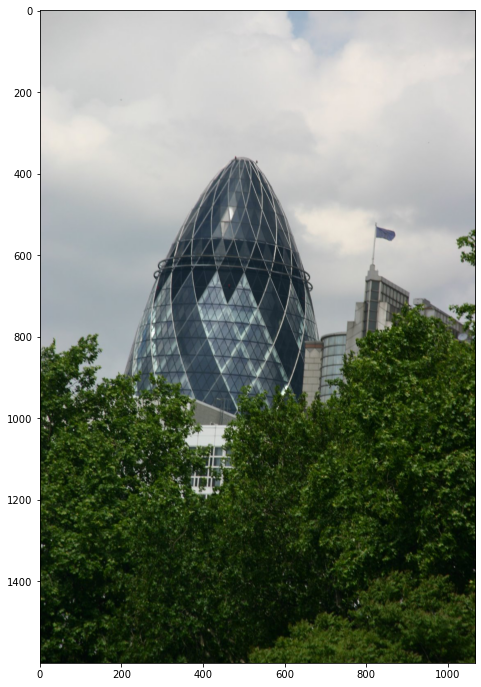

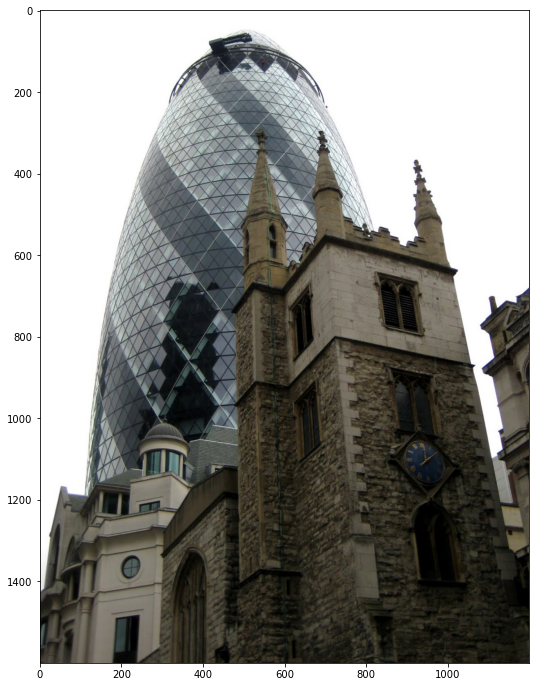

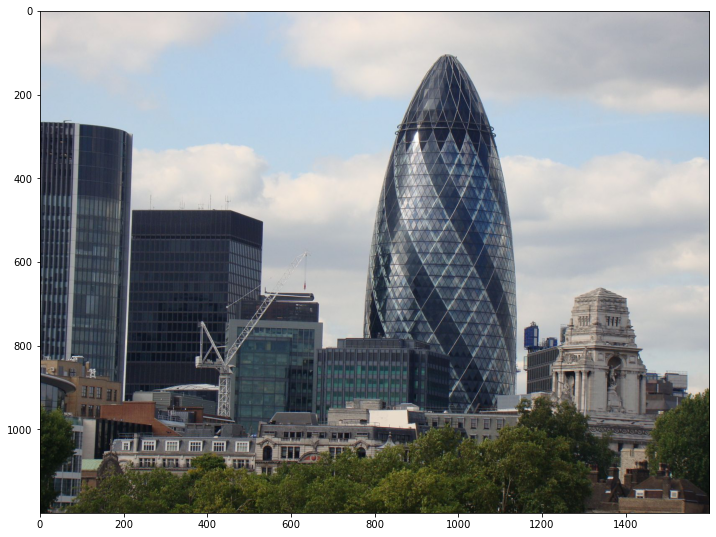

In [43]:
#check 10 images from any class
classid = '152'
d = train[train['landmark_id']==classid].reset_index(drop=True).head(10)
for i in range(len(d)):
    response = requests.get(d['url'][i])
    img = Image.open(BytesIO(response.content))
    plt.figure(figsize= (12,12))
    plt.imshow(img)


In [7]:
from IPython.display import Image
from IPython.core.display import HTML 

def display_category(urls):
    img_style = "width: 180px; margin: 0px; float: left; border: 1px solid black;"
    images_list = ''.join([f"<img style='{img_style}' src='{u}' />" for _, u in urls.head(12).iteritems()])

    display(HTML(images_list))

In [46]:
urls = train[train['landmark_id'] == '9999']['url']
display_category(urls)

In [19]:
urls = train[train['landmark_id'] == '7000']['url']
display_category(urls)

In [47]:
urls = train[train['landmark_id'] =='6051']['url'] 
display_category(urls)

# find how many photos in each class

In [10]:
df = train["landmark_id"].value_counts()
df

9633     48561
6051     47835
6599     21785
9779     17604
2061     12743
         ...  
1251         1
14092        1
6299         1
8381         1
4103         1
Name: landmark_id, Length: 14944, dtype: int64

In [11]:
df = df.reset_index()

In [12]:
df = df.rename(columns={"index":"landmark"})

In [13]:
df = df.rename(columns={"landmark_id":"num_im"})

In [14]:
df[df['landmark'] =="0"]

,landmark,num_im
2641,0,68


In [15]:
train[train['landmark_id']=="0"]

,id,url,landmark_id
2440,e1b812def4966754,http://lh6.ggpht.com/-JG99RdcTxhs/RyTNVRvYmJI/...,0
6813,fd230da2ec15924c,https://lh3.googleusercontent.com/-FKZuMN2uYqQ...,0
27982,c304be9cdb5a2455,https://lh5.googleusercontent.com/-wXX863wPAfA...,0
36167,4df132deb907f301,https://lh6.googleusercontent.com/-AaAeoj_icHY...,0
53210,a5f2709d10c83ccc,http://mw2.google.com/mw-panoramio/photos/medi...,0
...,...,...,...
1177131,2dda1b173233fd86,https://lh6.googleusercontent.com/-3R7aJuLN0pA...,0
1188362,89735d6bd3ed3a82,https://lh6.googleusercontent.com/-W7Z0zPkBKWw...,0
1195324,9d7a0de5ffcedcf5,https://lh4.googleusercontent.com/-j2kjEzmCPWE...,0
1200603,d4dd55b46006cc69,https://lh5.googleusercontent.com/-no4Cxl7eEtc...,0


In [ ]:
train['landmark_id'] = train['landmark_id'].astype("int64") #need to convert to numeric in order to filter

In [22]:
train[train['landmark_id']==0]['url'][2440]

'http://lh6.ggpht.com/-JG99RdcTxhs/RyTNVRvYmJI/AAAAAAAACAs/qwiQhsElc7Y/s1600/'

In [18]:
df

,landmark,num_im
0,9633,48561
1,6051,47835
2,6599,21785
3,9779,17604
4,2061,12743
...,...,...
14939,1251,1
14940,14092,1
14941,6299,1
14942,8381,1


In [19]:
df['landmark'] = df['landmark'].astype("int64")

In [33]:
df

,landmark,num_im
0,9633,48561
1,6051,47835
2,6599,21785
3,9779,17604
4,2061,12743
...,...,...
14939,3230,1
14940,5926,1
14941,6706,1
14942,3742,1


In [81]:
filter1 = df[df['num_im']==1]['landmark'].unique() #have only 1 photo
filter1

array([ 2859,  7598,  5988,  5575,    96,  5082,  4334,  5096,   664,
        5865,  2952,    83, 11214,   952,  9519,  8309, 13031,  4823,
       14221,   454, 14180,  7933, 11797,  6261,  6845,  5414,  1251,
        6173,  5015, 14092, 12918,  9511, 12587,  6224, 10420,  4608,
        1984,  7596,  6423,  6025,  2728, 14227, 13643,  7543,  8498,
       14189,  7964,   320, 12265, 12452,  9208, 10143,   123, 12703,
        2683,  4058,  3538,  1913, 11489,  4813,  4583,  2001, 14882,
        1307,  9559, 10317,  8232,  3587,  2016,  6086, 12825,  5043,
        1527, 12655, 13163,  4144,  3022,  5644,  1120, 10331,  5697,
        7482, 13342, 11895,  5745,   904, 13836,  4047,   708,  6708,
        9562, 14051,  9860, 10995,  3133, 11059,  8022,  7916, 10311,
        8615,   772,  9265, 12174,  3178,  2395, 10989, 10854,  9246,
       10275, 10556,  9579,  8139, 12864,  9140,  8797, 12502,  2615,
        8472,   909,  5107,  5030, 10190,  9563, 10007, 12848, 12355,
        2663,  8381,

In [82]:
len(filter1) #181 classes have 1 only photo

181

In [23]:
filter2 = df[df['num_im'].isin(range(100))]['landmark'].unique() #have less than 100 photos
filter2

array([10368, 10232,  5419, ...,  6299,  8381,  4103], dtype=int64)

In [24]:
len(filter2)

13002

In [90]:
urls= []
for i in train[train['landmark_id']==filter2[150]]['url']:
    urls.append(i)

In [91]:
urls[1]

'https://lh5.googleusercontent.com/-6_-b7rgWdz8/UecSOWAourI/AAAAAAAAGGw/KadzTDxj7Xk/s1600/'

In [87]:
train_filtered = train[~train['landmark_id'].isin(filter1)].sort_values('landmark_id') #except those that have 1 photo
train_filtered =train_filtered.reset_index(drop=True)
train_filtered

,id,url,landmark_id
0,90187c0b6f3fa112,https://lh4.googleusercontent.com/-ciIvVoX0BZs...,0
1,308c810d841f7127,https://lh6.googleusercontent.com/-ewJyWQo6e5E...,0
2,9d7a0de5ffcedcf5,https://lh4.googleusercontent.com/-j2kjEzmCPWE...,0
3,b693016dacad467d,https://lh3.googleusercontent.com/-gFBdgwYJa98...,0
4,4a683924a107f1f6,https://lh6.googleusercontent.com/-6THgwHM551U...,0
...,...,...,...
1154405,541fff8287505b02,https://lh5.googleusercontent.com/-GW9vMCTbgrQ...,14950
1154406,eb07f70b8a864dac,https://lh3.googleusercontent.com/-RbWe7p2jmhE...,14950
1154407,520944c09cc23aed,http://lh4.ggpht.com/-Sq95IME0Efs/RvvmtxjtEOI/...,14950
1154408,b309dd61bbcd6fa1,http://lh4.ggpht.com/-bLSxFosGgUg/S7aLcEchOSI/...,14950


In [15]:
train_filtered = train[~train['landmark_id'].isin(filter2)].sort_values('landmark_id') #those that have more than 100 
train_filtered =train_filtered.reset_index(drop=True)
train_filtered

,id,url,landmark_id
0,1c53b9f6e5ce8d7f,https://lh3.googleusercontent.com/-OMMsy8TX2Mg...,3
1,39d9b8da1109772b,https://lh5.googleusercontent.com/-kOwMVRw_NDc...,3
2,0f39c0aca40a6932,http://lh6.ggpht.com/-XfFW2Pqrhr4/Rc-gsGEuaXI/...,3
3,0402867756bec851,https://lh3.googleusercontent.com/-bRyG6Ebx1wA...,3
4,e76723ccb4a770f0,https://lh6.googleusercontent.com/-TSgQ9L7hIAg...,3
...,...,...,...
900215,770310f727270bfa,https://lh3.googleusercontent.com/-yyikxdtIZ_A...,14937
900216,dba477d53ded73a9,http://mw2.google.com/mw-panoramio/photos/medi...,14937
900217,7604a2786fd99e00,http://mw2.google.com/mw-panoramio/photos/medi...,14937
900218,ca008d1982689f46,https://lh6.googleusercontent.com/-tj7nkiujHDQ...,14937


In [16]:
train_filtered['landmark_id'].value_counts()

9633     48561
6051     47835
6599     21785
9779     17604
2061     12743
         ...  
12457      100
12844      100
1135       100
8776       100
456        100
Name: landmark_id, Length: 1942, dtype: int64

In [17]:
len(train_filtered['landmark_id'].unique()) #landmark ids that have more than 100

1942

In [18]:
train_filtered.to_csv('train_mas100.csv', index=False)

In [79]:
df_filtered = df[(df['num_im']>1000) & (df['num_im']<2000)] #only those landmarks that have from 1000 to 2000 photos
df_filtered

,landmark,num_im
33,3497,1958
34,3283,1930
35,2044,1909
36,5367,1898
37,7172,1793
...,...,...
101,9296,1014
102,5618,1013
103,10005,1007
104,6846,1004


In [84]:
landmarks = df_filtered['landmark'].unique()
landmarks

array([ 3497,  3283,  2044,  5367,  7172,  7661, 13653,  2870, 13170,
        8169,  5955,  6231, 10033, 11249,  1847, 11371,   233,  2449,
        1946, 10511,   165,  9434,  1602, 13475,  1472,  2241, 13444,
       13873, 12972,  8274,  4300,  4085,  5460,  7000,  2444, 13594,
        3130, 12676,  4981,  1213, 13332,  5046,   878, 10577,  7041,
        7008, 13876,  2341,   960,   152,  6476,  1546,  7764,  3426,
        9999,  7420,  9605,  5475,  4644,  4954, 11536,  3065,  5421,
        6597,  1310, 12966, 12647,  5166,  9296,  5618, 10005,  6846,
        7840], dtype=int64)

In [96]:
len(landmarks)

73

In [94]:
train_filtered = train[train['landmark_id'].isin(landmarks)].sort_values('landmark_id')
train_filtered =train_filtered.reset_index(drop=True)


In [95]:
train_filtered

,id,url,landmark_id
0,224d07dda87c1437,https://lh3.googleusercontent.com/-unDLIDYF4No...,152
1,0dded77c417ef347,https://lh5.googleusercontent.com/-SEx_ro6P1Ls...,152
2,34595cf8aa7eca4e,https://lh4.googleusercontent.com/-EfxlxC4Y9J4...,152
3,faf7b6c9b93a01eb,https://lh5.googleusercontent.com/-FpiQOHexVUo...,152
4,f4c0579589f81ace,http://lh6.ggpht.com/-NQlhs1l4VU4/RrzViOJhbUI/...,152
...,...,...,...
96821,3ca87c633c5e0c38,https://lh4.googleusercontent.com/-WJ4qbh5mSrM...,13876
96822,e292490a84faaaf8,https://lh5.googleusercontent.com/-eMXCycjGKhQ...,13876
96823,859a1f46b0e900f2,http://lh3.ggpht.com/-txQp2NxZdlI/SOoSiyB9DlI/...,13876
96824,677b9c1db5071a0d,https://lh6.googleusercontent.com/-4XuRcO4G-6A...,13876


In [97]:
train_filtered.to_csv('train_73clases_filtrado_1000_2000.csv', index=False) #save classes that have from 1000 to 2000 that we will use 